# Exercise 4 (Training without Bayes Optimization)

In [1]:
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

dfWind = pd.read_csv('../data/data_wind_preprocessed1.csv')
dfWind.head()

,Wind direction (gr),Wind gust max (m/s),Relative humidity min,Precipitation (m),Wind speed (m/s),Date,Hour
0,0.809017,3.8,0.60,0.0,1.8,2000-01-01 12:00:00,12
1,0.965926,4.7,0.55,0.0,2.7,2000-01-01 13:00:00,13
2,0.891007,4.9,0.50,0.0,2.0,2000-01-01 14:00:00,14
3,0.848048,5.8,0.44,0.0,2.5,2000-01-01 15:00:00,15
4,0.224951,5.8,0.43,0.0,2.4,2000-01-01 16:00:00,16


In [2]:
dfWind.shape

(90276, 7)

## Defining models and their parameters

In [3]:
from sklearn.linear_model import LinearRegression, Lasso, Ridge, BayesianRidge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.svm import SVR

n_col = dfWind.shape[1]

models_dict = {
    'SVR': {
        'model': SVR(),
        'scalers': {
            'scaler': [MinMaxScaler(), StandardScaler()]
        },
        'grid': {
            'model__C': [10**k for k in range(-3, 4)],
            'model__epsilon': [10**k for k in range(-3, 4)],
        },
        'best_params': {},
        'n_days': [1, 3, 7, 14, 21, 30, 60]
    },

    'Linear Regression': {
        'model': LinearRegression(),
        'scalers': {
            'scaler': [None, MinMaxScaler(), StandardScaler()]
        },
        'grid': {},
        'best_params': {},
        'n_days': [1, 3, 7, 14, 21, 30, 60, 90, 180, 365]
    },

    'Bayesian Ridge': {
        'model': BayesianRidge(),
        'scalers': {
            'scaler': [None, MinMaxScaler(), StandardScaler()]
        },
        'grid': {
            'model__alpha_1': [10**k for k in range(-6, -2)],
            'model__alpha_2': [10**k for k in range(-6, -2)],
            'model__lambda_1': [10**k for k in range(-6, -2)],
            'model__lambda_2': [10**k for k in range(-6, -2)],
        },
        'best_params': {},
        'n_days': [1, 3, 7, 14, 21, 30, 60, 90, 180, 365]
    },

    'Decision Tree': {
        'model': DecisionTreeRegressor(random_state=42),
        'scalers': {
            'scaler': [None]
        },
        'grid': {
            'model__max_depth': range(1, 50),
        },
        'best_params': {},
        'n_days': [1, 3, 7, 14, 21, 30, 60, 90, 180, 365]
    },

    'Random Forest': {
        'model': RandomForestRegressor(random_state=42),
        'scalers': {
            'scaler': [None]
        },
        'grid': {
            'model__max_depth': range(1, 50),
            'model__n_estimators': [10, 30, 50, 100, 200],
        },
        'best_params': {},
        'n_days': [1, 3, 7, 14, 21, 30, 60, 90, 180, 365]
    },

    'Gradient Boosting': {
        'model': GradientBoostingRegressor(random_state=42),
        'scalers': {
            'scaler': [None]
        },
        'grid': {
            'model__max_depth': range(1, n_col + 1),
            'model__n_estimators': [10, 30, 50, 100, 200],            
        },
        'best_params': {},
        'n_days': [1, 3, 7, 14, 21, 30, 60, 90, 180, 365]
    },

    'K-NN': {
        'model': KNeighborsRegressor(n_jobs=-1),
        'scalers': {
            'scaler': [None, MinMaxScaler(), StandardScaler()]
        },
        'grid': {
            'model__n_neighbors': range(1, 20),
        },
        'best_params': {},
        'n_days': [1, 3, 7, 14, 21, 30, 60, 90, 180, 365]
    },

    'Ridge': {
        'model': Ridge(random_state=42),
        'scalers': {
            'scaler': [None, MinMaxScaler(), StandardScaler()]
        },
        'grid': {
            'model__alpha': [10**k for k in range(-3, 4)]
        },
        'best_params': {},
        'n_days': [1, 3, 7, 14, 21, 30, 60, 90, 180, 365]
    },

    'Lasso': {
        'model': Lasso(random_state=42),
        'scalers': {
            'scaler': [None, MinMaxScaler(), StandardScaler()]
        },
        'grid': {
            'model__alpha': [10**k for k in range(-3, 4)]
        },
        'best_params': {},
        'n_days': [1, 3, 7, 14, 21, 30, 60, 90, 180, 365]
    },
}

In [4]:
results_dict = {
        name:{
            numDays: {
                'model': None, 'pred': [], 'test': [], 'cpu_time': None, 'MAPEs': [], 'R2s': [], 'RMSEs': []
            } for numDays in models_dict[name]['n_days']
        } for name in models_dict
}

print(results_dict)

{'SVR': {1: {'model': None, 'pred': [], 'test': [], 'cpu_time': None, 'MAPEs': [], 'R2s': [], 'RMSEs': []}, 3: {'model': None, 'pred': [], 'test': [], 'cpu_time': None, 'MAPEs': [], 'R2s': [], 'RMSEs': []}, 7: {'model': None, 'pred': [], 'test': [], 'cpu_time': None, 'MAPEs': [], 'R2s': [], 'RMSEs': []}, 14: {'model': None, 'pred': [], 'test': [], 'cpu_time': None, 'MAPEs': [], 'R2s': [], 'RMSEs': []}, 21: {'model': None, 'pred': [], 'test': [], 'cpu_time': None, 'MAPEs': [], 'R2s': [], 'RMSEs': []}, 30: {'model': None, 'pred': [], 'test': [], 'cpu_time': None, 'MAPEs': [], 'R2s': [], 'RMSEs': []}, 60: {'model': None, 'pred': [], 'test': [], 'cpu_time': None, 'MAPEs': [], 'R2s': [], 'RMSEs': []}}, 'Linear Regression': {1: {'model': None, 'pred': [], 'test': [], 'cpu_time': None, 'MAPEs': [], 'R2s': [], 'RMSEs': []}, 3: {'model': None, 'pred': [], 'test': [], 'cpu_time': None, 'MAPEs': [], 'R2s': [], 'RMSEs': []}, 7: {'model': None, 'pred': [], 'test': [], 'cpu_time': None, 'MAPEs': [],

## Hyperparametrization

We find the best parameters only on the first set

In [5]:
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from copy import deepcopy
from time import time
import os
import pickle

path_tuning = '../pickle/wind/tuning_gs.pkl'

if not os.path.exists(path_tuning):
    X = dfWind.drop(columns=['Wind speed (m/s)', 'Date'])
    y = dfWind['Wind speed (m/s)']
    for name in models_dict:
        print(f"Tuning {name}...")
        model_dict = models_dict[name]
        param_grid = {
            **model_dict['scalers'],
            **model_dict['grid']
        }
        for numDays in model_dict['n_days']:
            X_train = X.iloc[0:numDays*24]
            y_train = y.iloc[0:numDays*24]
            steps = [
                ('scaler', None),
                ('model', deepcopy(model_dict['model']))
            ]
            pipeline = Pipeline(steps)
            search_cv = GridSearchCV(pipeline, param_grid, scoring='r2', cv=5, n_jobs=-1)
            start = time()
            search_cv.fit(X_train, y_train)
            end = time()
            results_dict[name][numDays]['model'] = search_cv.best_estimator_
            model_dict['best_params'][numDays] = search_cv.best_params_
            print(f"{numDays} days => {round(end - start, 1)}s => {search_cv.best_params_}")
        print()
    with open(path_tuning, 'wb') as f:
        pickle.dump(results_dict, f)
else:
    with open(path_tuning, 'rb') as f:
        results_dict = pickle.load(f)

Tuning SVR...
1 days => 1.4s => {'model__C': 1, 'model__epsilon': 0.1, 'scaler': MinMaxScaler()}
3 days => 0.4s => {'model__C': 1, 'model__epsilon': 0.001, 'scaler': MinMaxScaler()}
7 days => 0.8s => {'model__C': 1, 'model__epsilon': 0.001, 'scaler': MinMaxScaler()}
14 days => 2.7s => {'model__C': 1, 'model__epsilon': 0.01, 'scaler': MinMaxScaler()}
21 days => 4.4s => {'model__C': 1, 'model__epsilon': 0.01, 'scaler': MinMaxScaler()}
30 days => 7.3s => {'model__C': 1, 'model__epsilon': 0.1, 'scaler': StandardScaler()}
60 days => 18.6s => {'model__C': 1, 'model__epsilon': 0.01, 'scaler': MinMaxScaler()}

Tuning Linear Regression...
1 days => 0.0s => {'scaler': None}
3 days => 0.0s => {'scaler': None}
7 days => 0.0s => {'scaler': None}
14 days => 0.0s => {'scaler': StandardScaler()}
21 days => 0.0s => {'scaler': MinMaxScaler()}
30 days => 0.1s => {'scaler': MinMaxScaler()}
60 days => 0.1s => {'scaler': MinMaxScaler()}
90 days => 0.1s => {'scaler': None}
180 days => 0.1s => {'scaler': None

## Training

In [6]:
from utils import model_evaluation_lr
from time import time
import os
import pickle

path_results = '../pickle/wind/results_gs.pkl'

if not os.path.exists(path_results):
    dict_pred = {}
    X = dfWind.drop(columns=['Wind speed (m/s)', 'Date'])
    y = dfWind['Wind speed (m/s)']

    for i, name in enumerate(models_dict):
        model_dict = models_dict[name]
        print(f"Training {name}...")
        for numDays in model_dict['n_days']:
            best_params_cleaned = {k.replace('model__', ''): v for k, v in model_dict['best_params'][numDays].items() if k.startswith('model__')}
            pipeline = Pipeline(
                [
                    ('scaler', model_dict['best_params'][numDays]['scaler']),
                    ('model', deepcopy(model_dict['model']).set_params(**best_params_cleaned)),
                ]
            )
            print(f'{numDays} days', end='')
            start = time()
            for j in range(0, dfWind.shape[0] - (numDays + 1)*24, 24):
                X_train = X.iloc[j:j+numDays*24]
                y_train = y.iloc[j:j+numDays*24]
                X_valid = X.iloc[j+numDays*24:j+((numDays + 1)*24)]
                y_valid = y.iloc[j+numDays*24:j+((numDays + 1)*24)]
                
                pipeline.fit(X_train, y_train)
                y_pred = pipeline.predict(X_valid)
                eval_lr = model_evaluation_lr(y_pred, y_valid)

                results_numDays = results_dict[name][numDays]
                results_numDays['pred'] += y_pred.tolist()
                results_numDays['test'] += y_valid.tolist()
                results_numDays['MAPEs'].append(eval_lr['mape'])
                results_numDays['R2s'].append(eval_lr['r2'])
                results_numDays['RMSEs'].append(eval_lr['rmse'])
            end = time()
            cpu_time = round(end - start, 1)
            print(f" => {cpu_time}s")
            results_numDays['cpu_time'] = cpu_time
        print()
    with open(path_results, 'wb') as f:
        pickle.dump(results_dict, f)
else:
    with open(path_results, 'rb') as f:
        results_dict = pickle.load(f)

Training SVR...
1 days => 11.0s
3 days => 11.7s
7 days => 14.9s
14 days => 24.7s
21 days => 40.2s
30 days => 65.8s
60 days => 207.0s

Training Linear Regression...
1 days => 7.7s
3 days => 7.7s
7 days => 7.8s
14 days => 10.7s
21 days => 10.5s
30 days => 10.5s
60 days => 10.6s
90 days => 8.0s
180 days => 8.4s
365 days => 11.3s

Training Bayesian Ridge...
1 days => 11.7s
3 days => 8.9s
7 days => 11.4s
14 days => 12.4s
21 days => 12.5s
30 days => 11.7s
60 days => 11.8s
90 days => 8.8s
180 days => 11.9s
365 days => 12.1s

Training Decision Tree...
1 days => 8.0s
3 days => 8.2s
7 days => 8.6s
14 days => 9.1s
21 days => 10.4s
30 days => 10.1s
60 days => 12.1s
90 days => 15.9s
180 days => 22.3s
365 days => 34.4s

Training Random Forest...
1 days => 357.8s
3 days => 388.6s
7 days => 141.8s
14 days => 188.5s
21 days => 499.4s
30 days => 41.9s
60 days => 1222.0s
90 days => 82.8s
180 days => 2612.1s
365 days => 4452.7s

Training Gradient Boosting...
1 days => 50.3s
3 days => 51.0s
7 days => 101.9

## Results

In [7]:
results_overall = pd.DataFrame(columns=['Model', 'CPU time', 'MAPE', 'R2', 'RMSE'])

for name in results_dict:
    model_dict = models_dict[name]
    for numDays in model_dict['n_days']:
        results = results_dict[name][numDays]
        eval = model_evaluation_lr(results['pred'], results['test'])
        new_row = {
            'Model': f"{name} ({numDays} days)",
            'CPU time': results['cpu_time'],
            'MAPE': eval['mape'],
            'R2': eval['r2'],
            'RMSE': eval['rmse']
        }
        results_overall = pd.concat([results_overall, pd.DataFrame(new_row, index=[0])], ignore_index=True)

In [8]:
results_overall.sort_values('R2', ascending=False, inplace=True)
print(results_overall.to_string(index=False))

                       Model  CPU time         MAPE    R2  RMSE
Gradient Boosting (365 days)     918.0 2.230000e-01 0.761 0.568
    Random Forest (365 days)    4452.7 2.380000e-01 0.760 0.574
 Gradient Boosting (90 days)     673.1 2.500000e-01 0.755 0.584
Gradient Boosting (180 days)    1127.6 2.390000e-01 0.754 0.582
    Random Forest (180 days)    2612.1 2.460000e-01 0.751 0.585
     Random Forest (60 days)    1222.0 2.450000e-01 0.746 0.592
 Gradient Boosting (60 days)     263.1 3.420000e-01 0.745 0.585
     Random Forest (90 days)      82.8 2.044674e+10 0.742 0.596
    Decision Tree (365 days)      34.4 4.199470e+11 0.739 0.602
 Gradient Boosting (30 days)     185.1 2.480000e-01 0.737 0.595
               SVR (60 days)     207.0 2.250000e-01 0.734 0.591
             K-NN (365 days)      76.8 2.260000e-01 0.732 0.596
Linear Regression (365 days)      11.3 2.510000e-01 0.726 0.608
            Ridge (365 days)       7.4 2.660000e-01 0.726 0.608
   Bayesian Ridge (365 days)      12.1 2

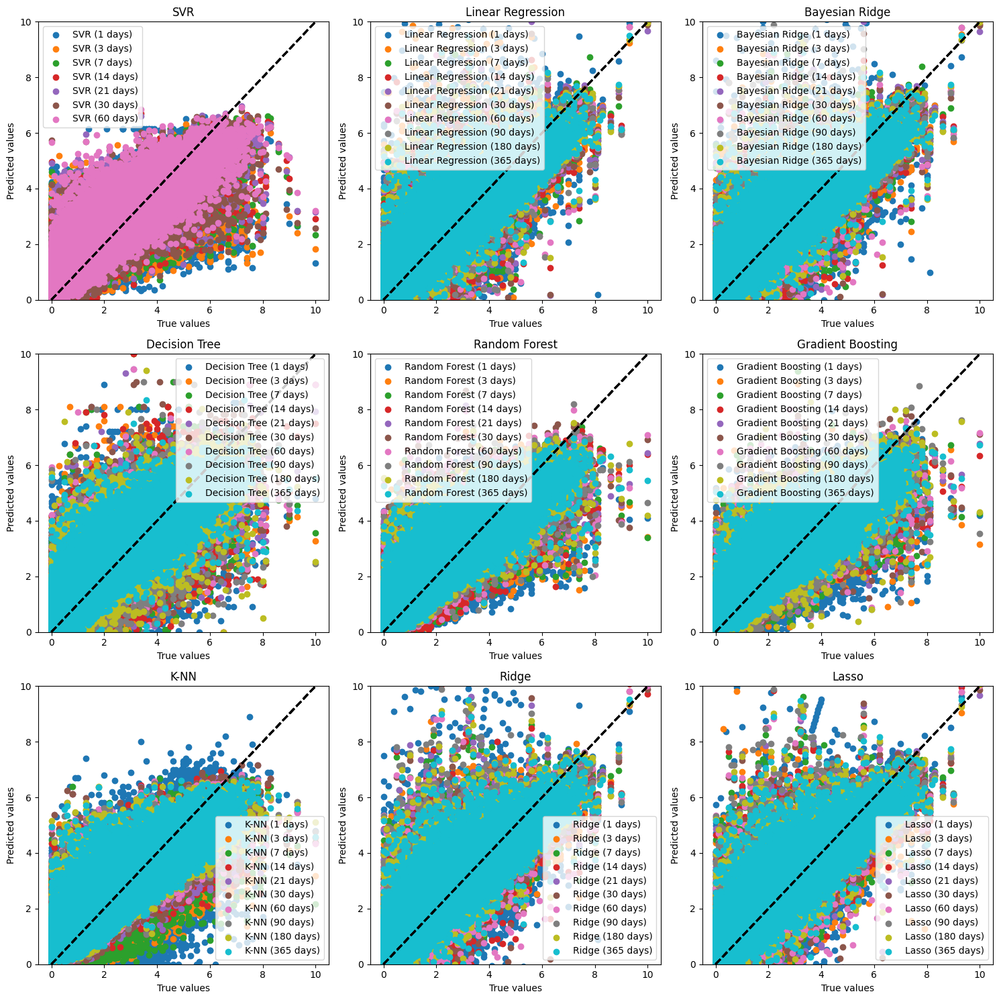

In [9]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(3, 3, figsize=(15, 15))
axs = axs.flatten()

for i, name in enumerate(results_dict):
    for numDays in models_dict[name]['n_days']:
        results = results_dict[name][numDays]
        y_pred = results['pred']
        y_test = results['test']
        axs[i].plot([0, max(y_test)], [0, max(y_test)], 'k--', lw=2)
        axs[i].scatter(y_test, y_pred, label=f"{name} ({numDays} days)")
        axs[i].set_ylim(0, max(y_test))
        axs[i].set_title(f"{name}")
        axs[i].set_xlabel('True values')
        axs[i].set_ylabel('Predicted values')
        axs[i].legend()

plt.tight_layout()
plt.show()

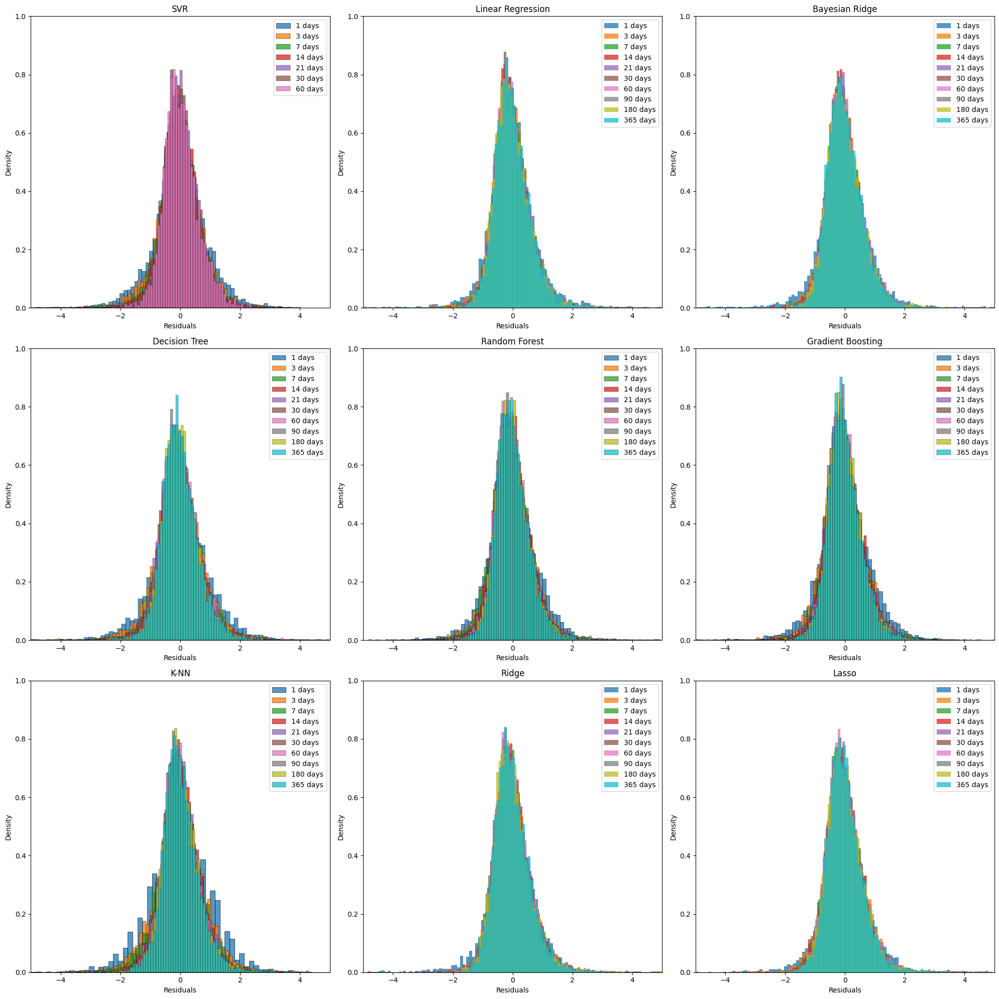

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns
import random as rd

fig, axs = plt.subplots(3, 3, figsize=(20, 20))
axs = axs.flatten()

for i, name in enumerate(results_dict):
    for numDays in models_dict[name]['n_days']:
        pred = results_dict[name][numDays]['pred']
        test = results_dict[name][numDays]['test']
        residuals = rd.sample([val_pred - val_test for val_pred, val_test in zip(pred, test)], 5000)
        sns.histplot(residuals, ax=axs[i], label=f"{numDays} days", stat='density')

    axs[i].set_title(f"{name}")
    axs[i].set_xlabel('Residuals')
    axs[i].set_ylabel('Density')
    axs[i].set_xlim(-5, 5)
    axs[i].set_ylim(0, 1)
    axs[i].legend()

plt.tight_layout()
plt.show()

In [11]:
from scipy.stats import norm, shapiro

df_gaussian_test = pd.DataFrame(columns=['Model', 'Mean', 'Std', 'p_value'])

for i, name in enumerate(results_dict):
    for numDays in models_dict[name]['n_days']:
        pred = results_dict[name][numDays]['pred']
        test = results_dict[name][numDays]['test']
        residuals = [val_pred - val_test for val_pred, val_test in zip(pred, test)]
        mean, std = norm.fit(residuals)
        _, p_value = shapiro(residuals)
        new_row = {
            'Model': f"{name} ({numDays} days)",
            'Mean': round(mean, 2),
            'Std': round(std, 2),
            'p_value': round(p_value, 2)
        }
        df_gaussian_test = pd.concat([df_gaussian_test, pd.DataFrame(new_row, index=[0])], ignore_index=True)

In [12]:
df_gaussian_test.sort_values('Std', inplace=True)
print(df_gaussian_test.to_string(index=False))

                       Model  Mean  Std  p_value
    Random Forest (365 days)  0.00 0.57      0.0
Gradient Boosting (365 days)  0.00 0.57      0.0
 Gradient Boosting (90 days) -0.01 0.58      0.0
    Random Forest (180 days) -0.01 0.58      0.0
Gradient Boosting (180 days) -0.01 0.58      0.0
 Gradient Boosting (60 days) -0.01 0.59      0.0
     Random Forest (60 days) -0.02 0.59      0.0
               SVR (60 days)  0.03 0.59      0.0
    Decision Tree (365 days)  0.00 0.60      0.0
             K-NN (365 days)  0.02 0.60      0.0
 Gradient Boosting (30 days) -0.02 0.60      0.0
     Random Forest (90 days) -0.01 0.60      0.0
              K-NN (90 days)  0.00 0.61      0.0
             K-NN (180 days)  0.00 0.61      0.0
 Gradient Boosting (21 days) -0.02 0.61      0.0
            Ridge (180 days) -0.01 0.61      0.0
            Ridge (365 days)  0.01 0.61      0.0
     Random Forest (30 days) -0.01 0.61      0.0
   Bayesian Ridge (365 days)  0.01 0.61      0.0
            Lasso (3

In [19]:
best_model = 'Random Forest'
best_nb_days = 365

y_test = results_dict[best_model][best_nb_days]['test']
y_pred = results_dict[best_model][best_nb_days]['pred']

In [20]:
from plotly import graph_objs as go
plot = go.Figure()


plot.add_trace(go.Scatter(x= dfWind['Date'], y=y_test, mode='lines', name='True'))
plot.add_trace(go.Scatter(x= dfWind['Date'], y=y_pred, mode='lines', name='Predicted'))
plot.update_layout(title=f'{best_model} ({best_nb_days} days)', xaxis_title='Date', yaxis_title='Wind speed (m/s)')
plot.show()